# Imports

In [1]:
import json
import pandas as pd
import matplotlib as mpl
from matplotlib import pyplot as plt
from sklearn import preprocessing as preproc
from sklearn.decomposition import PCA
import numpy as np

import random

import math

# import tqdm to notebook
from tqdm.notebook import tqdm

# https://stackoverflow.com/questions/52285104/3d-scatterplots-with-hue-colormap-and-legend
from mpl_toolkits.mplot3d import Axes3D

import seaborn as sns

try:
  from google.colab import drive
  drive.mount('/content/drive')

  COLAB = True
except ModuleNotFoundError:
  COLAB = False

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder

from minisom import MiniSom


import matplotlib.pyplot as plt
from matplotlib.patches import RegularPolygon, Ellipse
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import cm, colorbar
from matplotlib.lines import Line2D

%matplotlib inline

# Load Data

In [2]:
df = pd.read_parquet("diabetic_data_cleaned_pca.parquet")

# fix some types that parquet didn't get right
df["admission_type_id"] = df["admission_type_id"].astype("category")
df["discharge_disposition_id"] = df["discharge_disposition_id"].astype("category")
df["admission_source_id"] = df["admission_source_id"].astype("category")

display(df.shape)
display(df.dtypes)
display(df.head(2).T)

(100244, 32)

race                        category
gender                      category
age                         category
admission_type_id           category
discharge_disposition_id    category
admission_source_id         category
time_in_hospital               int64
num_lab_procedures             int64
num_procedures                 int64
num_medications                int64
number_outpatient              int64
number_emergency               int64
number_inpatient               int64
diag_1                      category
diag_2                      category
diag_3                      category
number_diagnoses               int64
metformin                   category
repaglinide                 category
glimepiride                 category
glipizide                   category
glyburide                   category
pioglitazone                category
rosiglitazone               category
insulin                     category
glyburide-metformin         category
change                          bool
d

,0,1
race,Caucasian,AfricanAmerican
gender,Female,Female
age,[10-20),[20-30)
admission_type_id,1,1
discharge_disposition_id,1,1
admission_source_id,7,7
time_in_hospital,3,2
num_lab_procedures,59,11
num_procedures,0,5
num_medications,18,13


In [3]:
with open("data_dictionary.json", "r") as f:
  data_info = json.load(f)

NUM_COLUMNS = data_info["Numeric Columns"]
NOM_COLUMNS = data_info["Nominal Columns"]
ORD_COLUMNS = data_info["Ordinal Columns"]
TGT = data_info["Target"]

In [4]:
def print_hex_som(som, data, ref, title=""):
    # Inspired in https://github.com/JustGlowing/minisom/blob/master/examples/HexagonalTopology.ipynb, but with a couple changes
    xx, yy = som.get_euclidean_coordinates()
    umatrix = som.distance_map()
    weights = som.get_weights()

    f = plt.figure(figsize=(13,13))
    ax = f.add_subplot(111)

    plt.title(title, loc='left')

    ax.set_aspect('equal')

    # iteratively add hexagons
    for i in range(weights.shape[0]):
        for j in range(weights.shape[1]):
            wy = yy[(i, j)] * np.sqrt(3) / 2
            hex = RegularPolygon((xx[(i, j)], wy), 
                                 numVertices=6, 
                                 radius=.95 / np.sqrt(3),
                                 facecolor=cm.Blues(umatrix[i, j]), 
                                 alpha=.4, 
                                 edgecolor='gray')
            ax.add_patch(hex)

    # create a collor map based on the size of the target
    colors = cm.rainbow(np.linspace(0, 1, len(ref.cat.categories)))

    for cnt, x in enumerate(tqdm(data)):
        w = som.winner(x)
        wx, wy = som.convert_map_to_euclidean(w) 
        wy = wy * np.sqrt(3) / 2

        tgt_id = np.where(ref.cat.categories == ref[cnt])[0][0]

        theta = random.uniform(0, 2 * math.pi)
        r_prime = random.uniform(0, .3)
        dx = r_prime * math.cos(theta)
        dy = r_prime * math.sin(theta)
        plt.plot(wx + dx,
                 wy + dy,
                 ".",
                 alpha=.7,
                 markerfacecolor='None',
                 markeredgecolor=colors[tgt_id-1], 
                 markersize=4)

    # add bar on the side
    xrange = np.arange(weights.shape[0])
    yrange = np.arange(weights.shape[1])
    plt.xticks(xrange-.5, xrange)
    plt.yticks(yrange * np.sqrt(3) / 2, yrange)

    divider = make_axes_locatable(plt.gca())
    ax_cb = divider.new_horizontal(size="5%", pad=0.05)    

    cb1 = colorbar.ColorbarBase(ax_cb, cmap=cm.Blues, orientation='vertical', alpha=.4)
    cb1.ax.get_yaxis().labelpad = 16
    cb1.ax.set_ylabel('distance from neurons in the neighbourhood', rotation=270, fontsize=16)

    plt.gcf().add_axes(ax_cb)

    # add legend with the colours
    if len(ref.cat.categories) > 10:
        # too many categories to show, add a message saying too many categories on the top left
        # ax.text with a box around
        ax.text(0.03, 0.03, "Too many categories to show in the legend", transform=ax.transAxes,
                fontsize=8, color="#7f0029", verticalalignment='bottom', bbox=dict(facecolor='white', alpha=0.8))
    else:
        legend_elements = []
        for i, cat in enumerate(ref.cat.categories):
            legend_elements.append(Line2D([0], [0], marker='.', color=colors[i], label=cat,
                           markerfacecolor='w', markersize=14, linestyle='None', markeredgewidth=2))

        ax.legend(handles=legend_elements, bbox_to_anchor=(0.01, 0.01), loc='lower left', 
                  borderaxespad=0., ncol=5, fontsize=10)



    plt.show()

## SOM - Jaccard index

 [ 100000 / 100000 ] 100% - 0:00:00 left 
 quantization error: 2.6402601482868566
size: 8, sigma: 1, lr: 1, qe: 2.6402601482868566


  0%|          | 0/100244 [00:00<?, ?it/s]

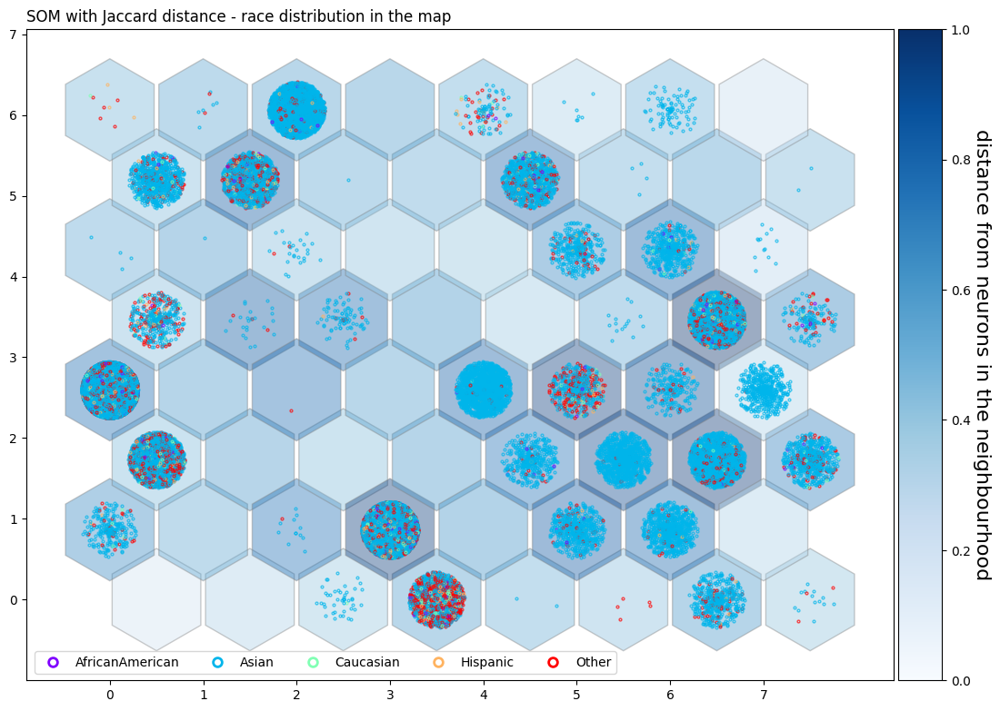

  0%|          | 0/100244 [00:00<?, ?it/s]

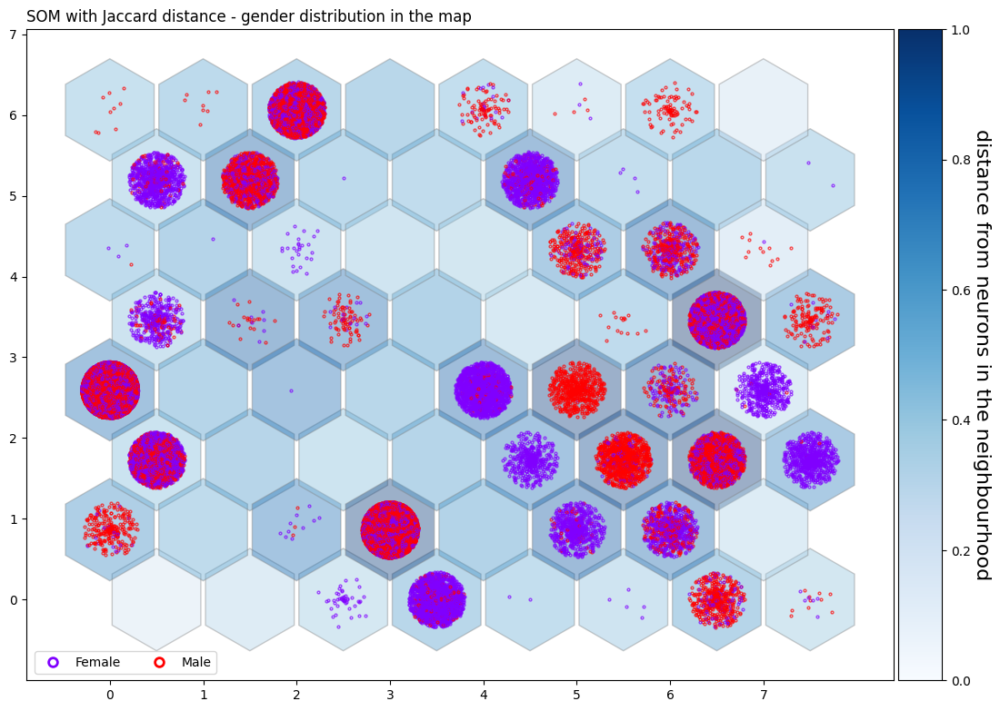

  0%|          | 0/100244 [00:00<?, ?it/s]

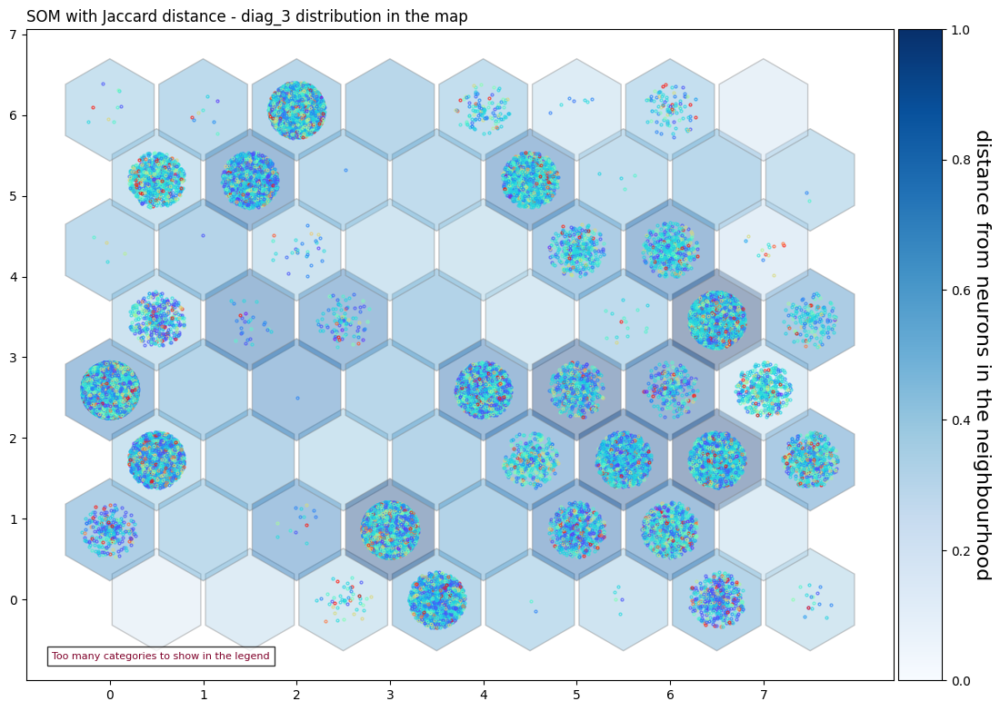

  0%|          | 0/100244 [00:00<?, ?it/s]

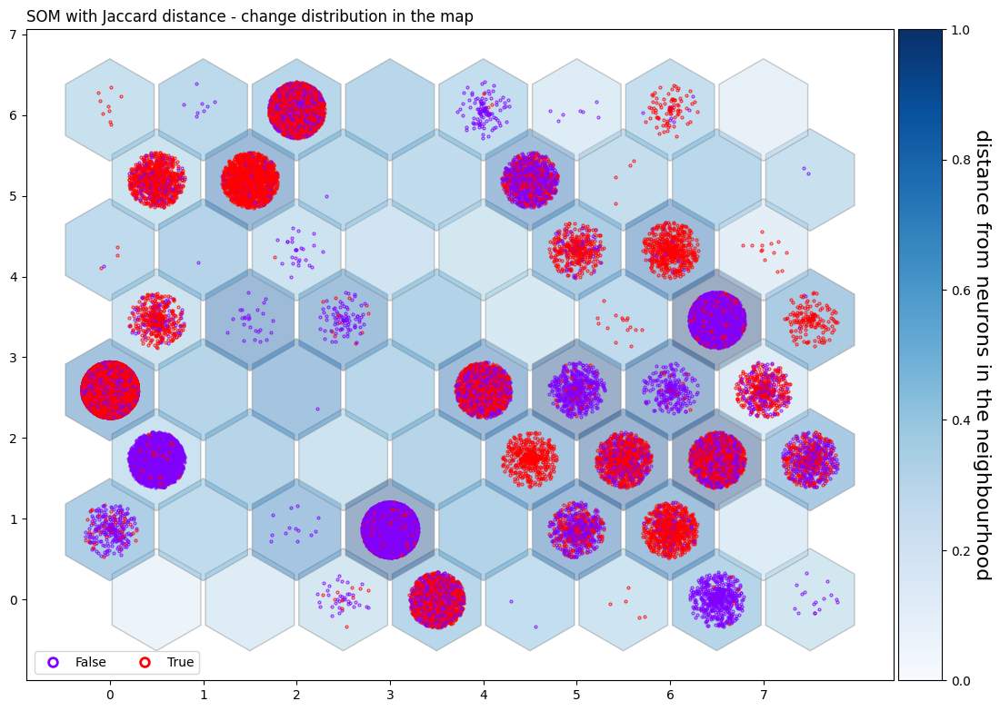

  0%|          | 0/100244 [00:00<?, ?it/s]

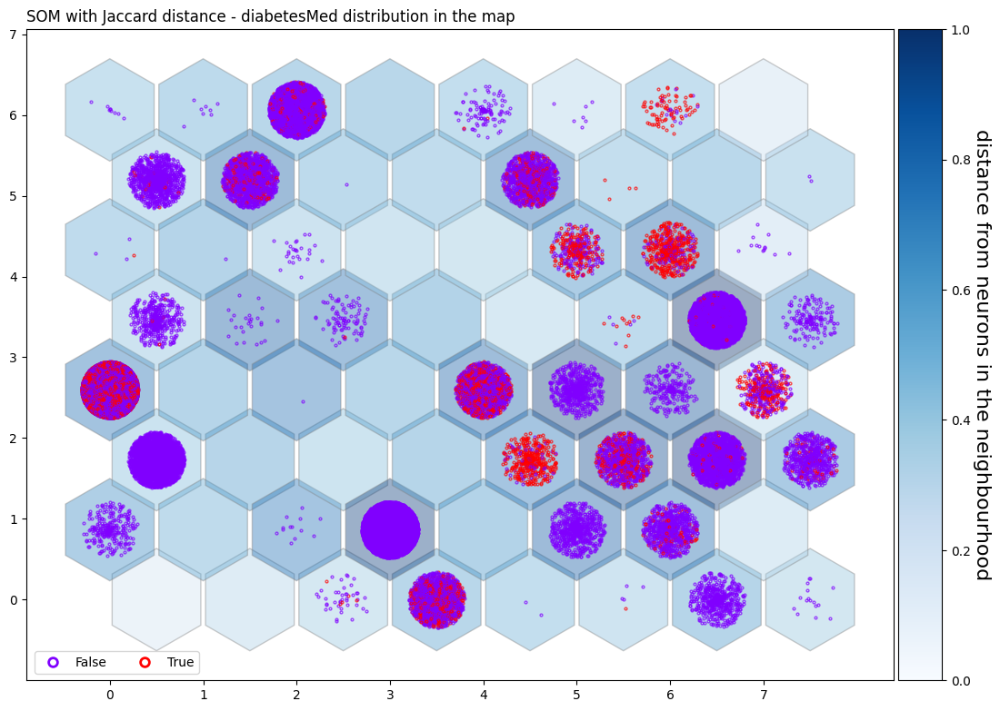

  0%|          | 0/100244 [00:00<?, ?it/s]

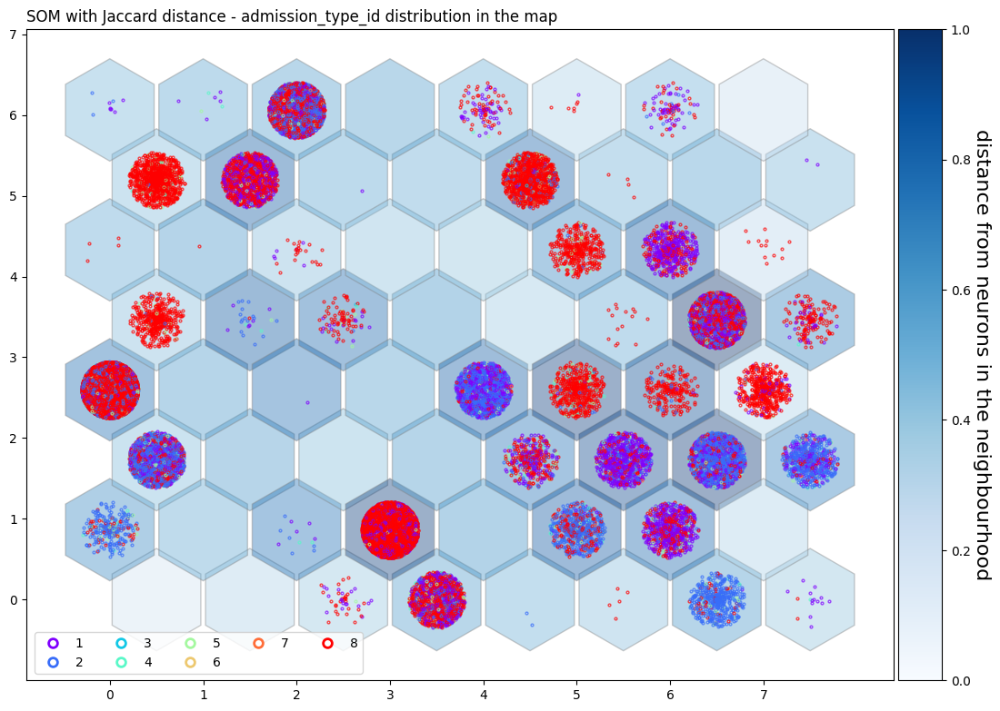

  0%|          | 0/100244 [00:00<?, ?it/s]

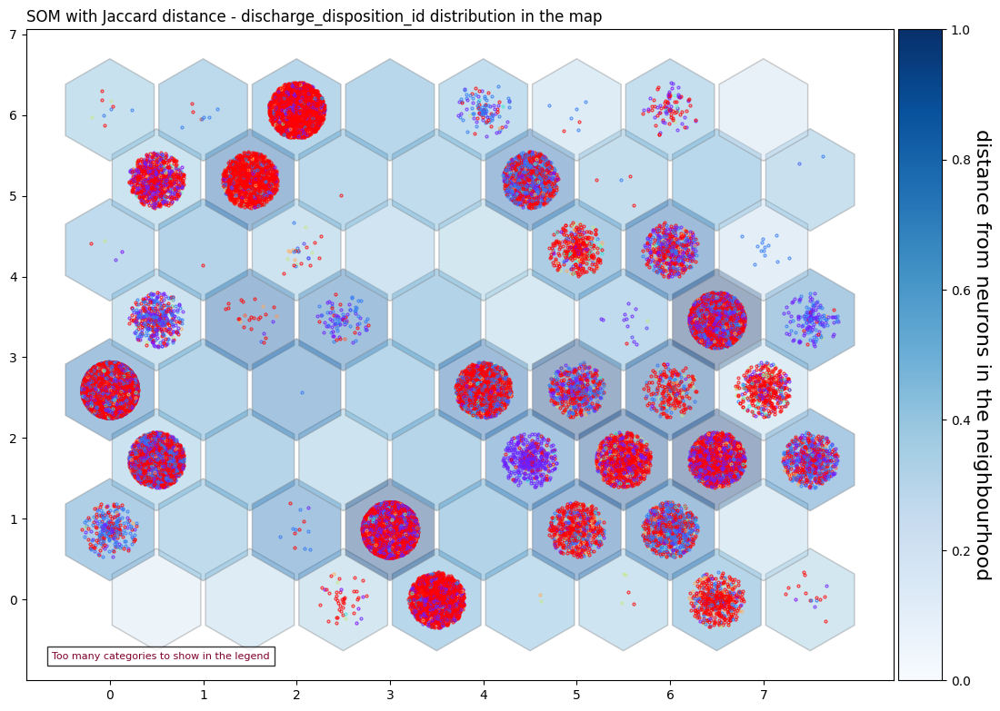

  0%|          | 0/100244 [00:00<?, ?it/s]

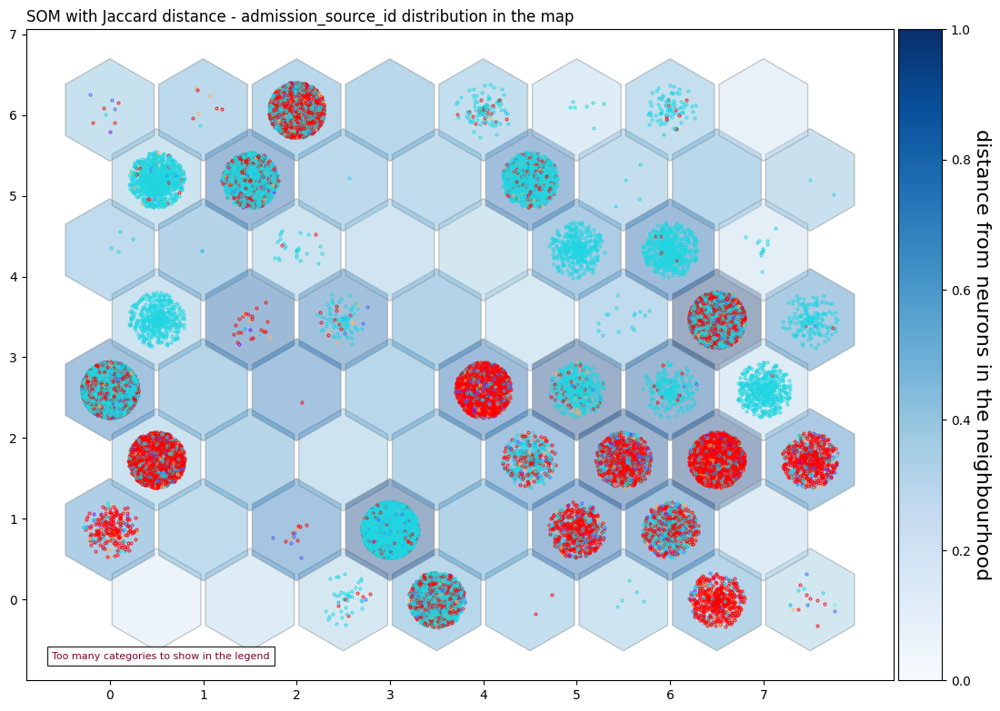

  0%|          | 0/100244 [00:00<?, ?it/s]

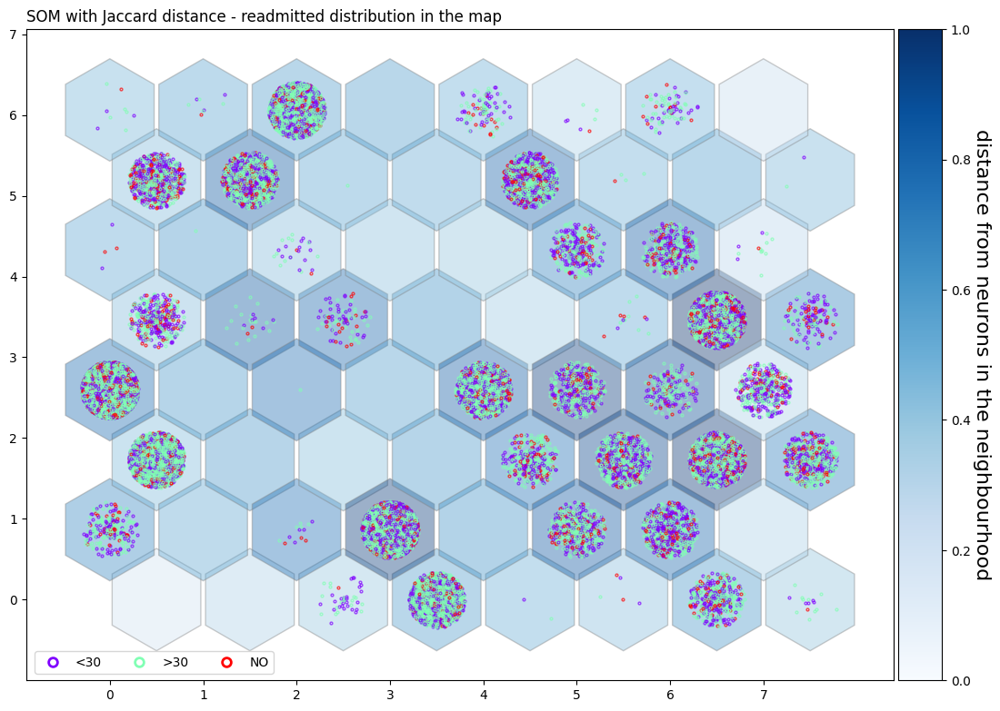

In [5]:
# One hot encode on the nominal columns
temp_jaccard = df
temp_jaccard = temp_jaccard[NOM_COLUMNS + ORD_COLUMNS]

ohe = OneHotEncoder(drop="first", sparse_output=False)
temp_jaccard = ohe.fit_transform(temp_jaccard)

def jaccard(x, w):
    return np.divide(np.minimum(x, w).sum(axis=-1), np.maximum(x, w).sum(axis=-1))

som_size = 8
lr = 1
sigma = 1

som_jaccard = MiniSom(som_size, som_size, temp_jaccard.shape[1], sigma=sigma, learning_rate=lr, random_seed=42, topology="hexagonal", activation_distance=jaccard)
som_jaccard.train(temp_jaccard, 100000, verbose=True)
print(f"size: {som_size}, sigma: {sigma}, lr: {lr}, qe: {som_jaccard.quantization_error(temp_jaccard)}")

for col in NOM_COLUMNS[:2] + NOM_COLUMNS[4:] + [TGT]:
    print_hex_som(som_jaccard, temp_jaccard, df[col].astype("category"), f"SOM with Jaccard distance - {col} distribution in the map")

## SOM - Euclidean

 [ 100000 / 100000 ] 100% - 0:00:00 left 
 quantization error: 1.9586674049464827
size: 20, sigma: 1, lr: 1, qe: 1.9586674049464827


  0%|          | 0/100244 [00:00<?, ?it/s]

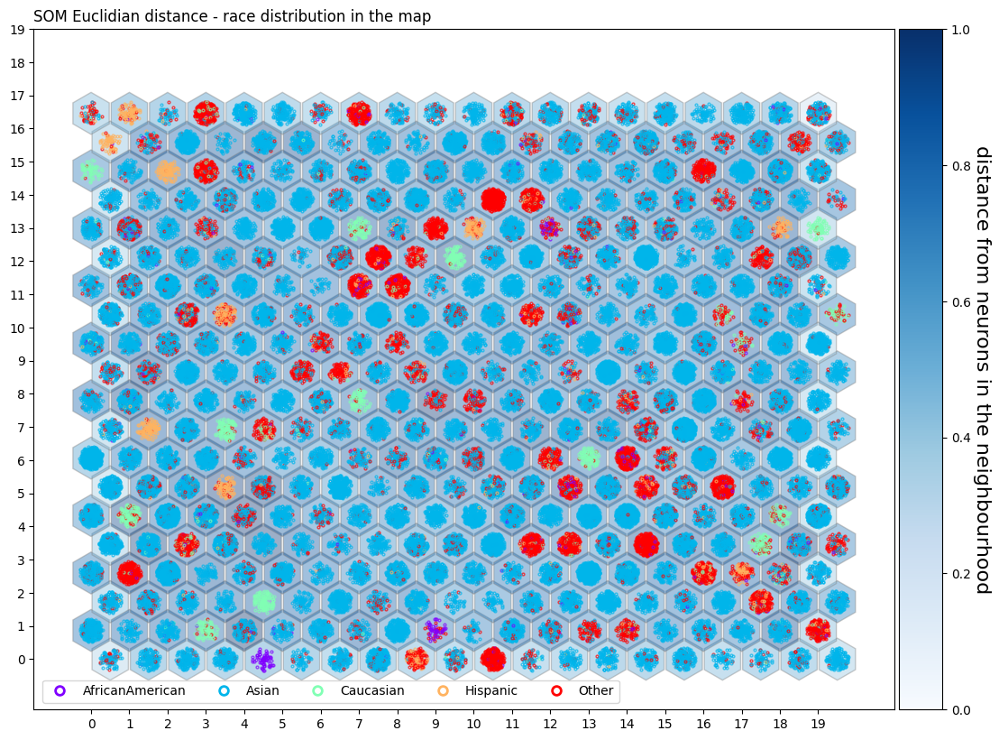

  0%|          | 0/100244 [00:00<?, ?it/s]

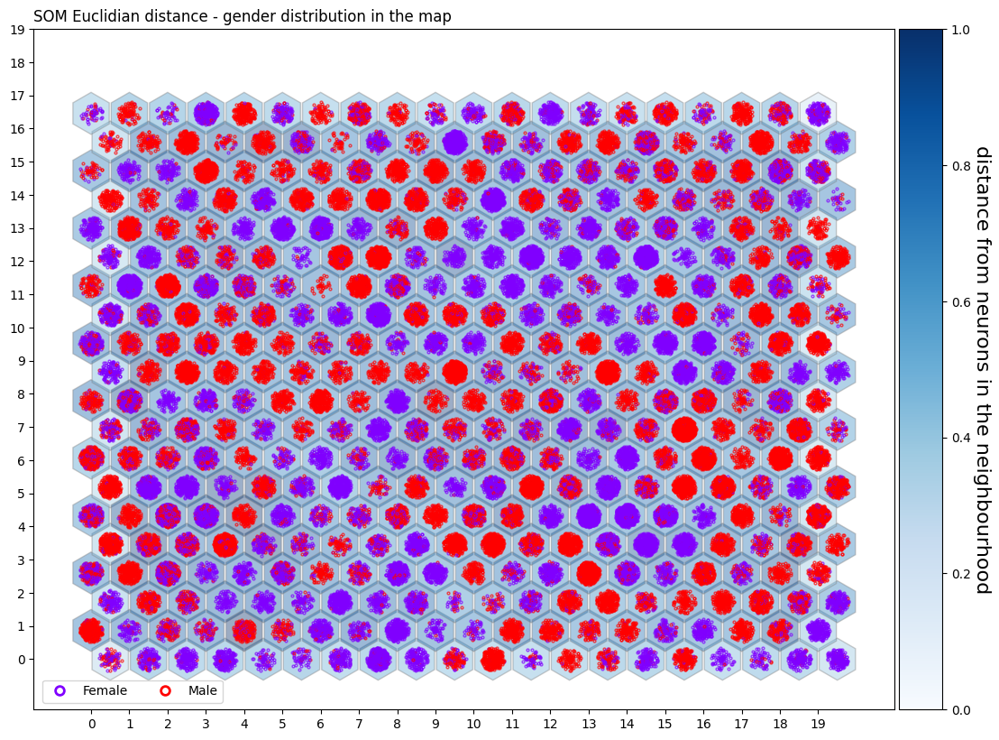

  0%|          | 0/100244 [00:00<?, ?it/s]

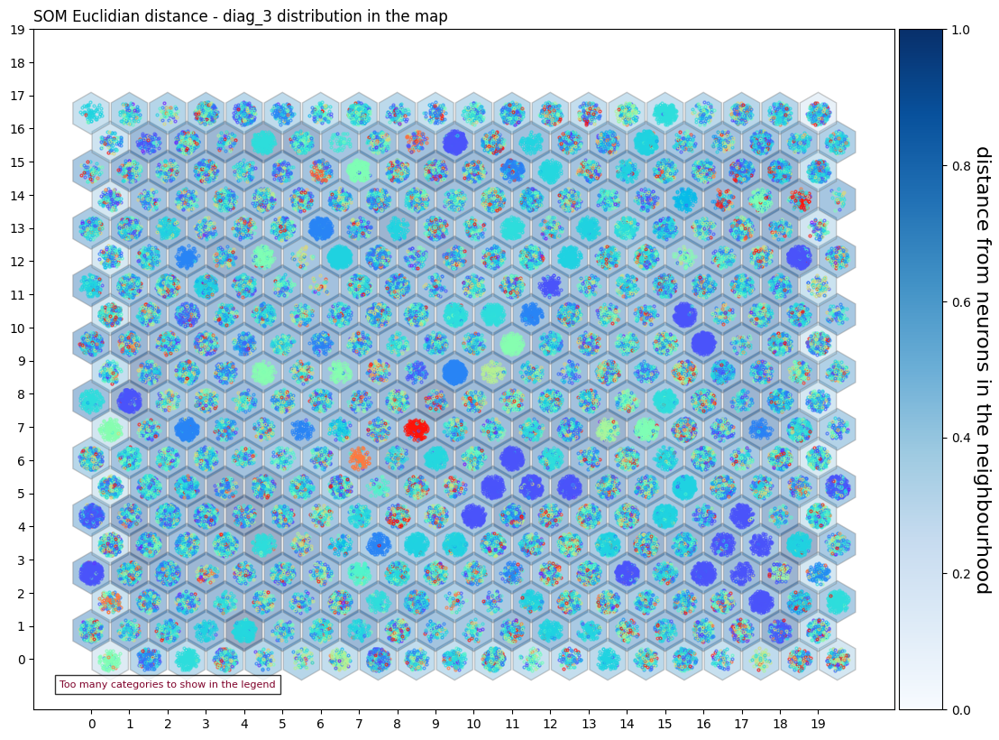

  0%|          | 0/100244 [00:00<?, ?it/s]

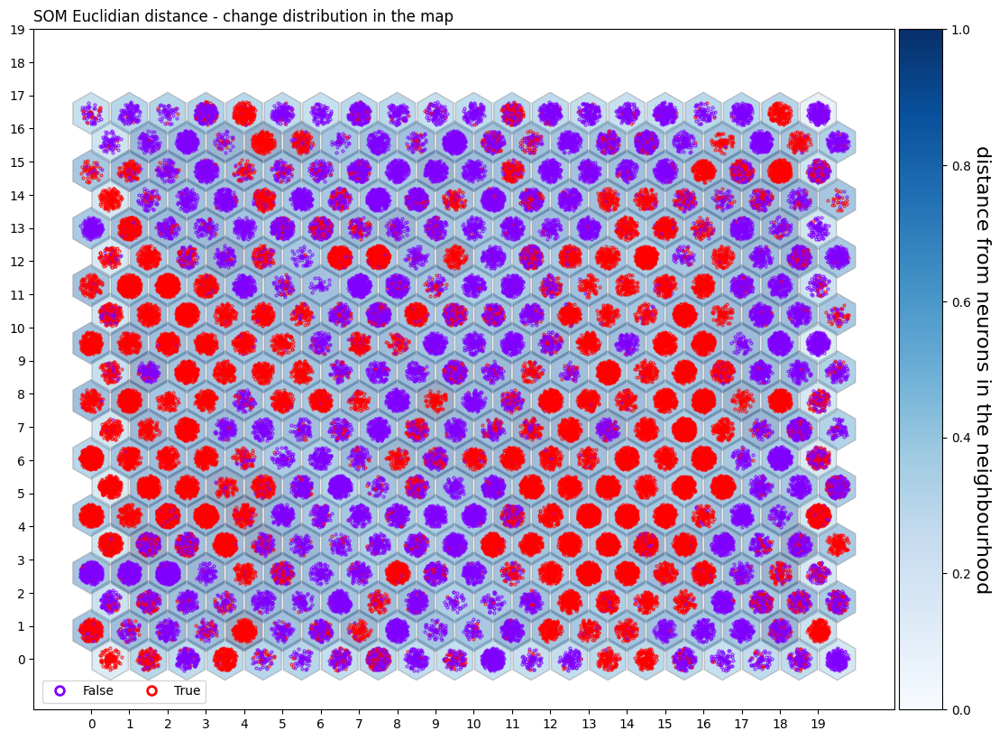

  0%|          | 0/100244 [00:00<?, ?it/s]

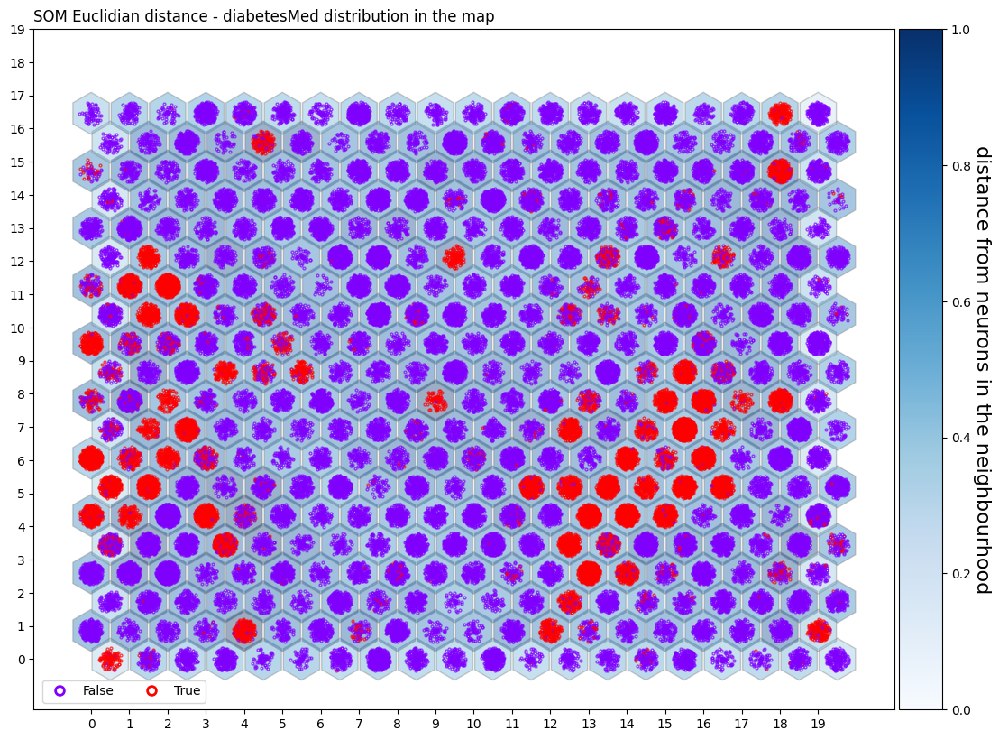

  0%|          | 0/100244 [00:00<?, ?it/s]

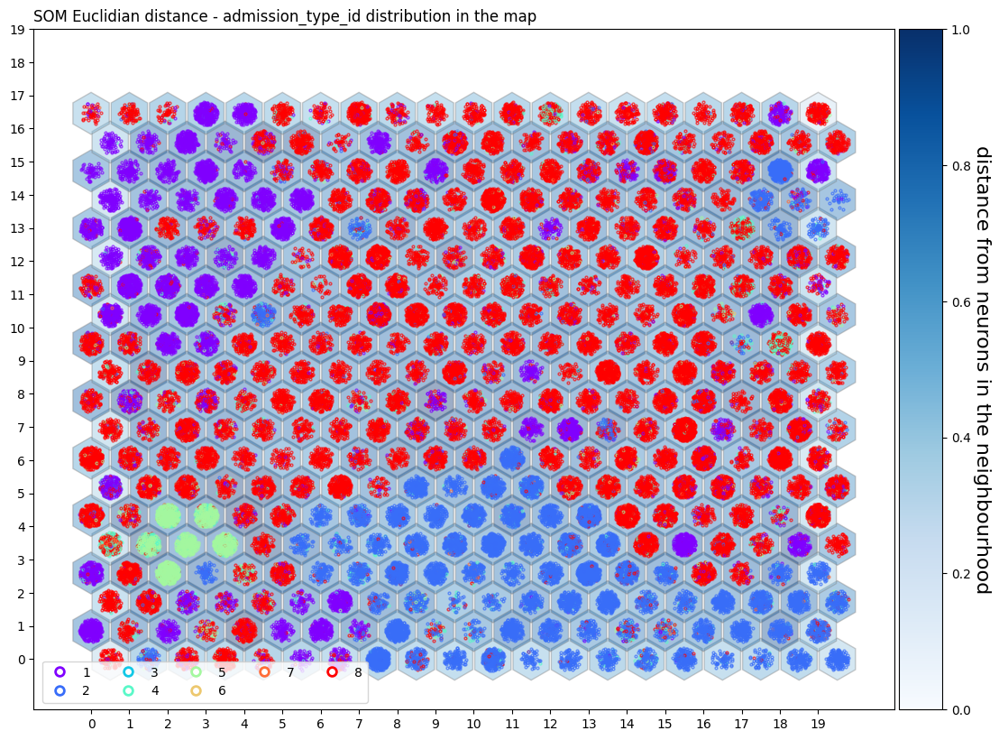

  0%|          | 0/100244 [00:00<?, ?it/s]

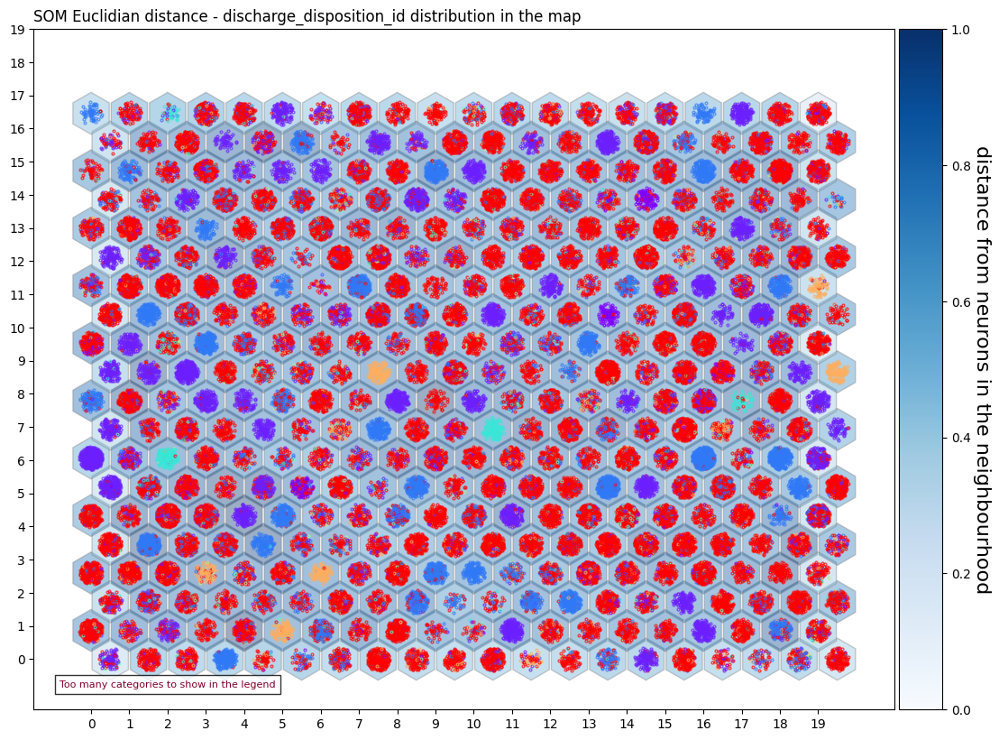

  0%|          | 0/100244 [00:00<?, ?it/s]

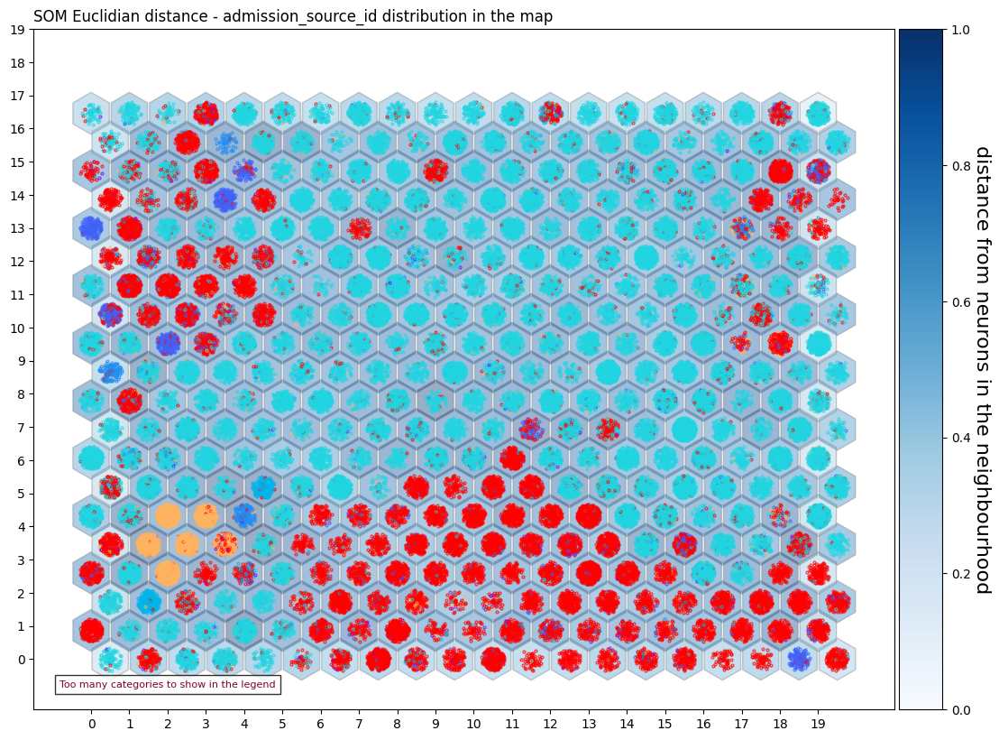

  0%|          | 0/100244 [00:00<?, ?it/s]

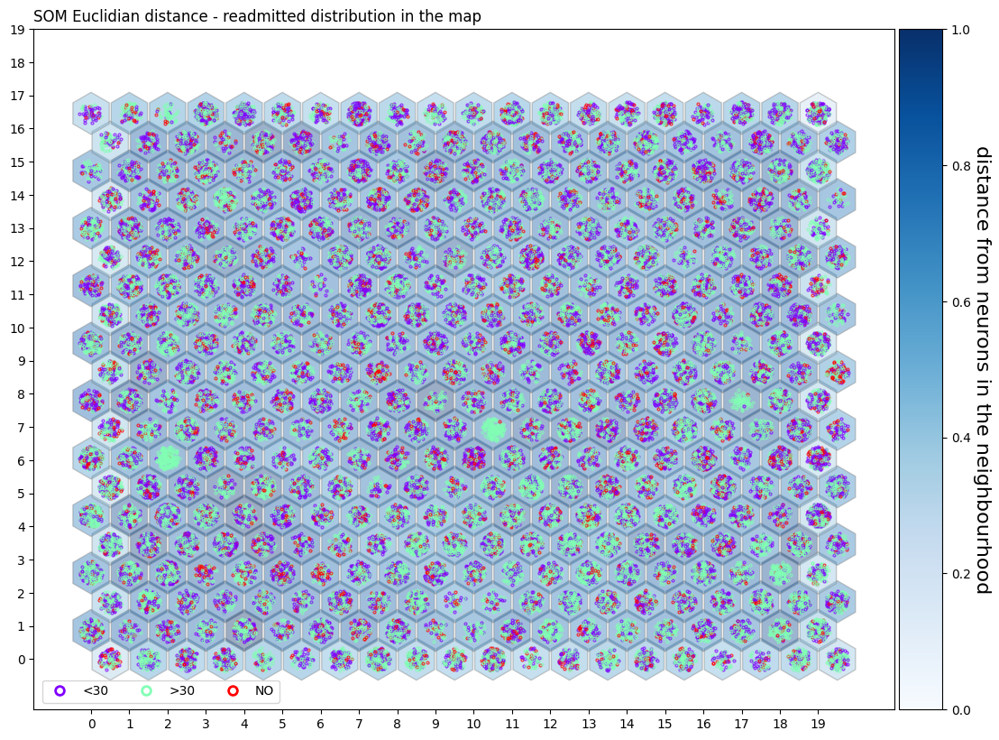

In [6]:
temp_euc = df.copy()

# one hot encoding the ordinal vars
temp_nom = temp_euc[NOM_COLUMNS]
ohe = OneHotEncoder(drop="first", sparse_output=False)
temp_nom = ohe.fit_transform(temp_nom)

temp_ord = temp_euc[ORD_COLUMNS]

# label encoder using category order the nominal vars
temp_ord = temp_ord.apply(lambda x: x.cat.codes)
scaler = preproc.MinMaxScaler()
temp_ord = scaler.fit_transform(temp_ord)

temp_euc = np.concatenate([temp_nom, temp_ord], axis=1)

som_size = 20
lr = 1
sigma = 1

som_euc = MiniSom(som_size, som_size, temp_euc.shape[1], sigma=sigma, learning_rate=lr, random_seed=42, topology="hexagonal")
som_euc.train(temp_euc, 100000, verbose=True)
print(f"size: {som_size}, sigma: {sigma}, lr: {lr}, qe: {som_euc.quantization_error(temp_euc)}")

for col in NOM_COLUMNS[:2] + NOM_COLUMNS[4:] + [TGT]:
    print_hex_som(som_euc, temp_euc, df[col].astype("category"), f"SOM Euclidian distance - {col} distribution in the map")

# Adding SOM variables in the dataset
to (maybe) replace all the categorical variables in the training

In [7]:
winner_jaccard = np.array([som_jaccard.winner(x) for x in temp_jaccard])
df["som_jaccard_0"] = winner_jaccard[:, 0]
df["som_jaccard_1"] = winner_jaccard[:, 1]

In [8]:
winner_euc = np.array([som_euc.winner(x) for x in temp_euc])
df["som_euc_0"] = winner_euc[:, 0]
df["som_euc_1"] = winner_euc[:, 1]

# Conclusion

Note that everything done here was made without the target, so it is part of the EDA unsupervised learning techniques. The core idea in this notebook was to create a topological grid using Self-Organized Maps to replace all the categorical variables.

Two maps were created, one using the Jaccard index and another using Euclidean distance. The latter took advantage of some of the nominal categories that had been cast to ordinal during cleaning.

Four new columns were added, two for the first map's two dimensions and two for the second map. We use either the categorical variables or one of these two pairs for the modelling. In principle, it makes no sense to use both pairs, or one of the pairs and the categoricals.

# Save df

In [9]:
display(df.shape)
display(df.dtypes)

display(df.describe().T)

filename = "diabetic_data_cleaned_pca_som"

df.to_csv(f"{filename}.csv", index=False)
df.to_parquet(f"{filename}.parquet")

(100244, 36)

race                        category
gender                      category
age                         category
admission_type_id           category
discharge_disposition_id    category
admission_source_id         category
time_in_hospital               int64
num_lab_procedures             int64
num_procedures                 int64
num_medications                int64
number_outpatient              int64
number_emergency               int64
number_inpatient               int64
diag_1                      category
diag_2                      category
diag_3                      category
number_diagnoses               int64
metformin                   category
repaglinide                 category
glimepiride                 category
glipizide                   category
glyburide                   category
pioglitazone                category
rosiglitazone               category
insulin                     category
glyburide-metformin         category
change                          bool
d

,count,mean,std,min,25%,50%,75%,max
time_in_hospital,100244.0,4.420275e+00,2.991273,1.000000,2.000000,4.000000,6.000000,14.000000
num_lab_procedures,100244.0,4.317372e+01,19.691484,1.000000,32.000000,44.000000,57.000000,132.000000
num_procedures,100244.0,1.350275e+00,1.710913,0.000000,0.000000,1.000000,2.000000,6.000000
num_medications,100244.0,1.611782e+01,8.116424,1.000000,11.000000,15.000000,20.000000,81.000000
number_outpatient,100244.0,3.725610e-01,1.274074,0.000000,0.000000,0.000000,0.000000,42.000000
number_emergency,100244.0,1.990144e-01,0.933541,0.000000,0.000000,0.000000,0.000000,76.000000
number_inpatient,100244.0,6.394697e-01,1.262773,0.000000,0.000000,0.000000,1.000000,21.000000
number_diagnoses,100244.0,7.497007e+00,1.839537,3.000000,6.000000,8.000000,9.000000,16.000000
PC1,100244.0,-5.091051e-17,0.299783,-0.400778,-0.232916,-0.088537,0.155953,1.159058
PC2,100244.0,-6.268567e-17,0.230848,-0.741977,-0.142057,-0.017638,0.132432,0.844482
